<a href="https://colab.research.google.com/github/bpizarrogalleguillos/IAmetodologia2025/blob/main/Radiomics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Paso 1: Instalación de librerías necesarias
!pip install  SimpleITK matplotlib nibabel plotly nilearn
!pip install git+https://github.com/AIM-Harvard/pyradiomics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 61.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Discarding https://files.pythonhosted.org/packages/03/c1/20fc2c50ab1e3304da36d866042a1905a2b05a1431ece35448ab6b4578f2/pyradiomics-3.1.0.tar.gz (from https://pypi.org/simple/pyradiomics/): Requested pyradiomics from https://files.pythonhosted.org/packages/03/c1/20fc2c50ab1e3304da36d866042a1905a2b05a1431ece35448ab6b4578f2/pyradiomics-3.1.0.tar.gz has inconsistent version: expected '3.1.0', but metadata has '3.0.1a1'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 32.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 120.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:

# Paso 2: Importar librerías
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from radiomics import featureextractor
import pandas as pd
import SimpleITK as sitk

# Nilearn
from nilearn import plotting, datasets, image
from nilearn.image import math_img
from nilearn.image import new_img_like

# Visualización 3D con Plotly de la lesión esférica
from scipy.ndimage import gaussian_filter
from skimage import measure
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px

import seaborn as sns


# Visualización de lesiones en cerebro

In [ ]:
# haxby dataset to have EPI images and masks
haxby_dataset = datasets.fetch_haxby()

# print basic information on the dataset
print(
    f"First subject anatomical nifti image (3D) is at: {haxby_dataset.anat[0]}"
)
print(
    f"First subject functional nifti image (4D) is at: {haxby_dataset.func[0]}"
)

haxby_anat_filename = haxby_dataset.anat[0]
haxby_mask_filename = haxby_dataset.mask_vt[0]
haxby_func_filename = haxby_dataset.func[0]

# one motor activation map
stat_img = datasets.load_sample_motor_activation_image()

[_add_readme_to_default_data_locations] Added README.md to /root/nilearn_data

[get_dataset_dir] Dataset created in /root/nilearn_data/haxby2001

[fetch_single_file] Downloading data from https://www.nitrc.org/frs/download.php/7868/mask.nii.gz ...

[fetch_single_file]  ...done. (1 seconds, 0 min)

[fetch_single_file] Downloading data from http://data.pymvpa.org/datasets/haxby2001/MD5SUMS ...

[fetch_single_file]  ...done. (0 seconds, 0 min)

[fetch_single_file] Downloading data from http://data.pymvpa.org/datasets/haxby2001/subj2-2010.01.14.tar.gz ...

[_chunk_report_] Downloaded 819200 of 291168628 bytes (0.3%%,  6.6min remaining)

[_chunk_report_] Downloaded 12959744 of 291168628 bytes (4.5%%,   48.3s remaining)

[_chunk_report_] Downloaded 28172288 of 291168628 bytes (9.7%%,   30.3s remaining)

[_chunk_report_] Downloaded 43040768 of 291168628 bytes (14.8%%,   24.9s remaining)

[_chunk_report_] Downloaded 58720256 of 291168628 bytes (20.2%%,   21.2s remaining)

[_chunk_report_] Downloaded 76029952 of 291168628 bytes (26.1%%,   18.0s remaining)

[_chunk_report_] Downloaded 92397568 of 291168628 bytes (31.7%%,   15.8s remaining)

[_chunk_report_] Downloaded 109715456 of 291168628 bytes (37.7%%,   13.9s remaining)

[_chunk_report_] Downloaded 127172608 of 291168628 bytes (43.7%%,   12.1s remaining)

[_chunk_report_] Downloaded 144842752 of 291168628 bytes (49.7%%,   10.6s remaining)

[_chunk_report_] Downloaded 162037760 of 291168628 bytes (55.7%%,    9.2s remaining)

[_chunk_report_] Downloaded 178323456 of 291168628 bytes (61.2%%,    8.0s remaining)

[_chunk_report_] Downloaded 194764800 of 291168628 bytes (66.9%%,    6.7s remaining)

[_chunk_report_] Downloaded 213082112 of 291168628 bytes (73.2%%,    5.4s remaining)

[_chunk_report_] Downloaded 232734720 of 291168628 bytes (79.9%%,    4.0s remaining)

[_chunk_report_] Downloaded 251650048 of 291168628 bytes (86.4%%,    2.7s remaining)

[_chunk_report_] Downloaded 271785984 of 291168628 bytes (93.3%%,    1.3s remaining)

[_chunk_report_] Downloaded 291110912 of 291168628 bytes (100.0%%,    0.0s remaining)

[fetch_single_file]  ...done. (20 seconds, 0 min)

[uncompress_file] Extracting data from 
/root/nilearn_data/haxby2001/9cabe068089e791ef0c5fe930fc20e30/subj2-2010.01.14.tar.gz...

[uncompress_file] .. done.

First subject anatomical nifti image (3D) is at: /root/nilearn_data/haxby2001/subj2/anat.nii.gz
First subject functional nifti image (4D) is at: /root/nilearn_data/haxby2001/subj2/bold.nii.gz


/usr/local/lib/python3.11/dist-packages/nilearn/plotting/html_stat_map.py:209: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=0.2.
  data, mask, threshold = _threshold_data(data, threshold)
/usr/local/lib/python3.11/dist-packages/nilearn/plotting/html_stat_map.py:621: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=0.2.
  colors = colorscale(
/usr/local/lib/python3.11/dist-packages/nilearn/plotting/find_cuts.py:66: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(



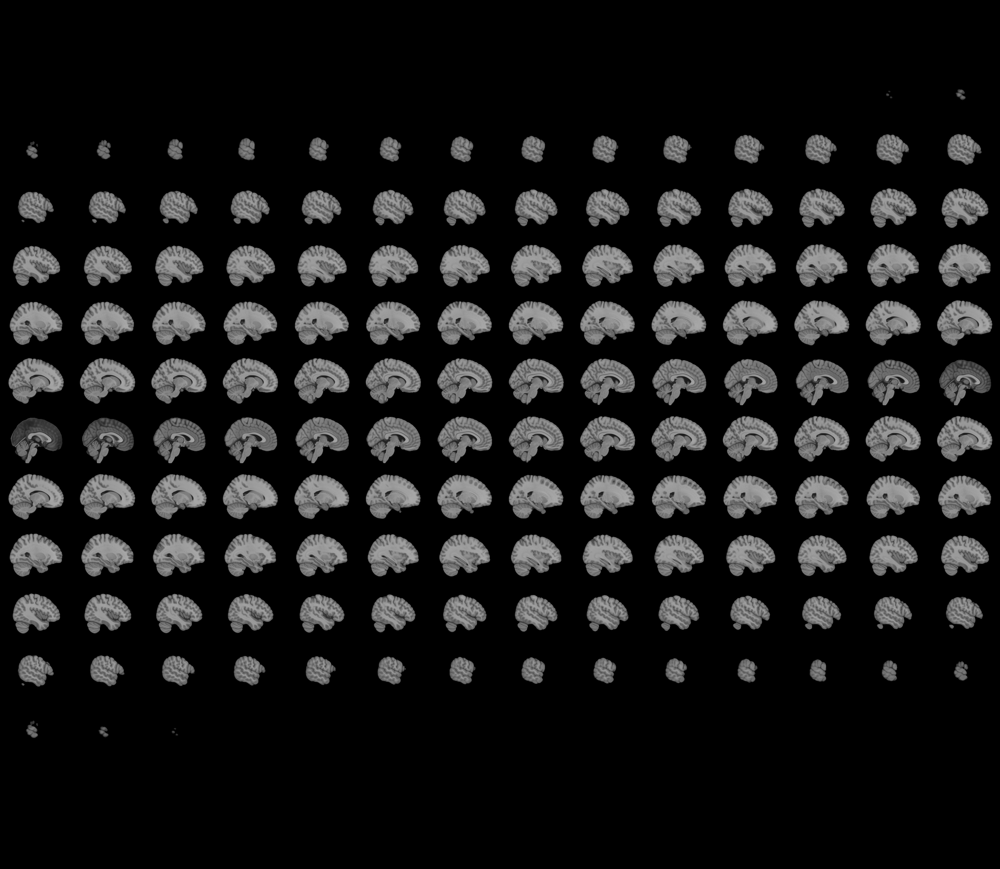
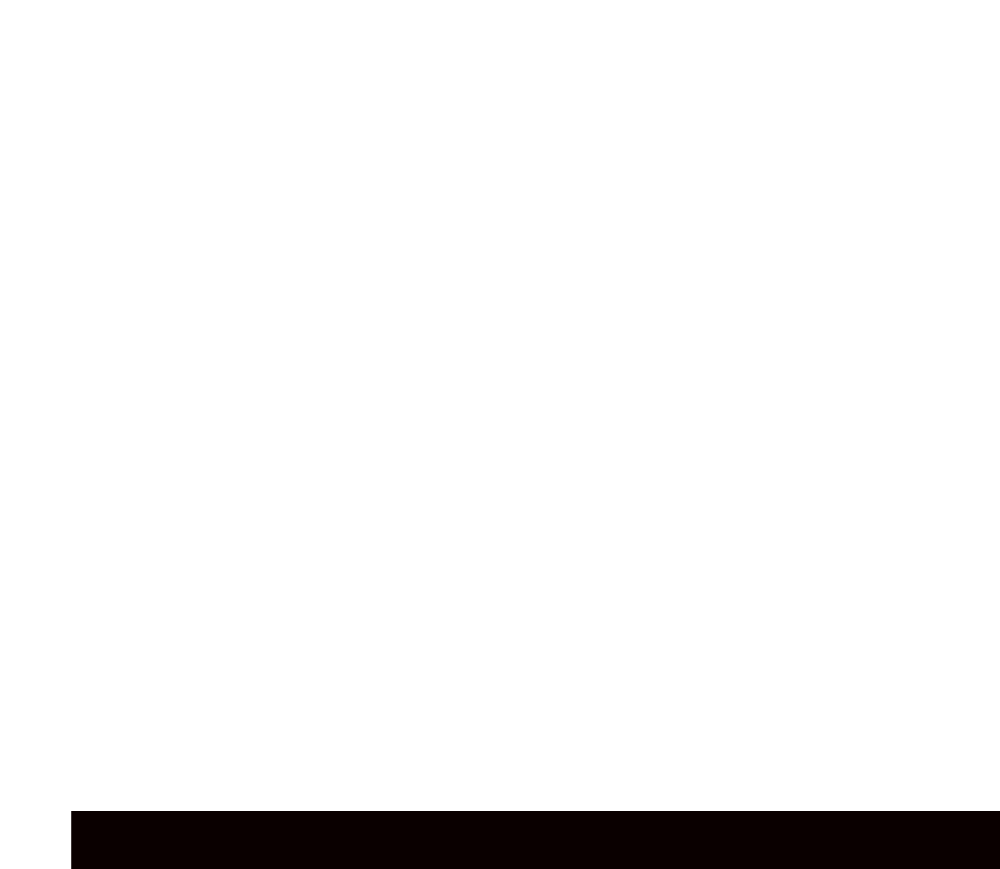

In [ ]:

# Cargar plantilla anatómica MNI
mni_img = datasets.load_mni152_template()

# Simular una lesión (máscara binaria)
mask_img = math_img("img > 100", img=mni_img)

shape = mni_img.shape

# Visualización interactiva con color más anatómico
view = plotting.view_img(
    mask_img,
    bg_img=mni_img,
    cmap='hot',               # overlay en tonos cálidos (lesión)
    black_bg=True,           # fondo blanco, más clínico
    threshold=0.2,
    title='Cerebro MNI152'
)
view

# Lesión benigna

In [ ]:


# 1. Crear una máscara de lesión: una esfera en el hemisferio derecho
center = np.array([120, 90, 100])  # coordenadas aproximadas (X, Y, Z)
radius = 10

# Crear volumen vacío
lesion_data = np.zeros(shape)

# Llenar una esfera con valor 1 en las coordenadas alrededor del centro
for x in range(shape[0]):
    for y in range(shape[1]):
        for z in range(shape[2]):
            if np.linalg.norm(np.array([x, y, z]) - center) < radius:
                lesion_data[x, y, z] = 1

# 2. Crear una imagen NIfTI desde la máscara
lesion_img = new_img_like(mni_img, lesion_data)



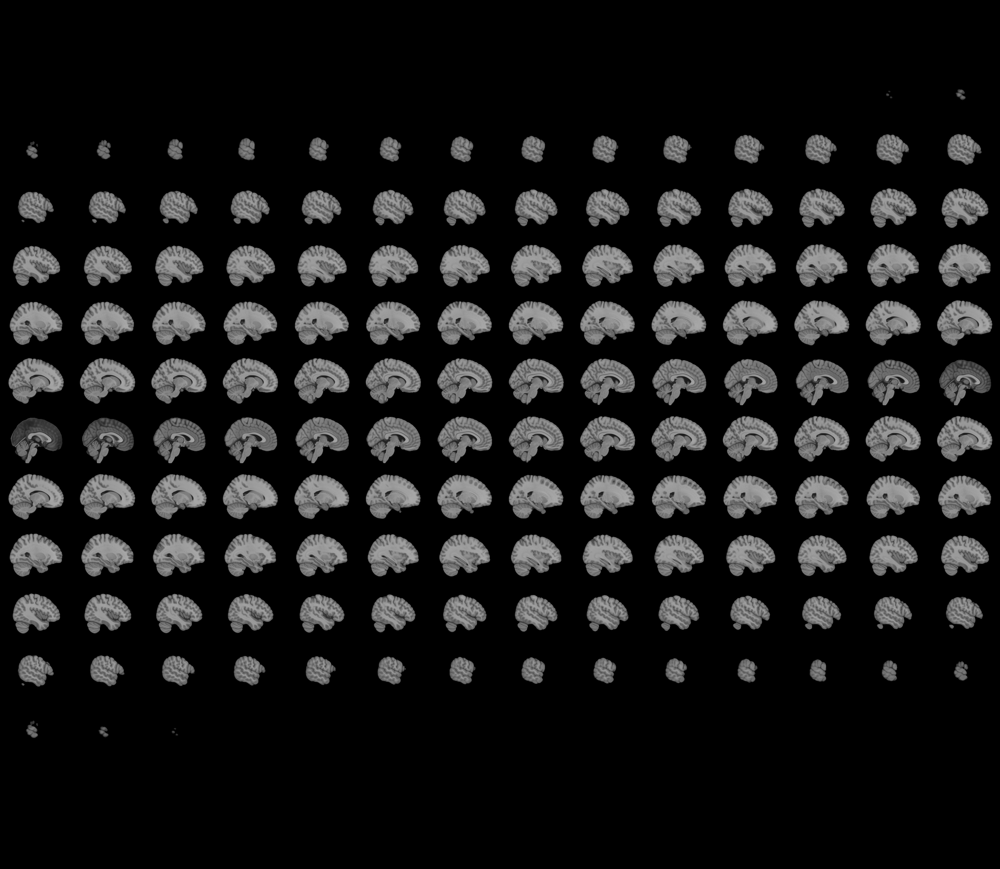
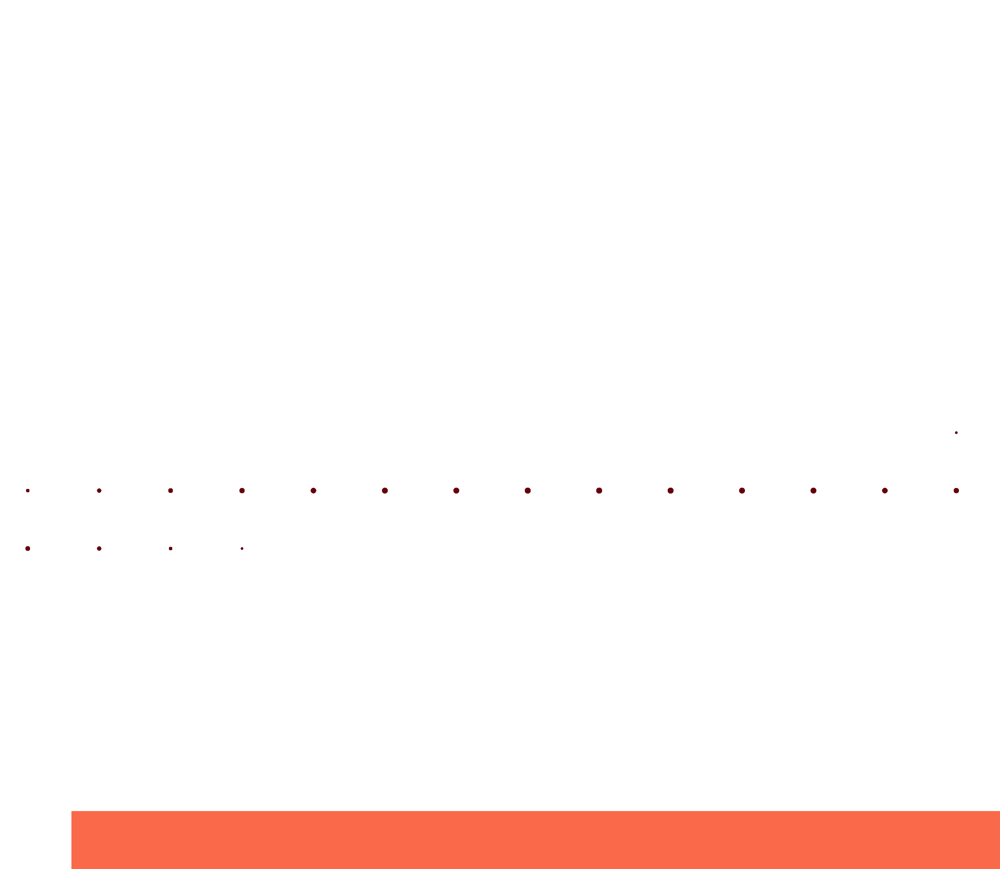

In [ ]:

# 3. Visualizar en visor interactivo con colores anatómicos
view = plotting.view_img(
    lesion_img,
    bg_img=mni_img,
    cmap='Reds',         # rojo = lesión
    black_bg=True,
    threshold=0.1,
    title="Lesión simulada en hemisferio derecho"
)
view

In [ ]:
# Obtener la superficie 3D con marching cubes
verts, faces, _, _ = measure.marching_cubes(lesion_data.astype(float), level=0.5)
xv, yv, zv = verts.T
i, j, k = faces.T

# Crear figura interactiva
fig = go.Figure(data=[
    go.Mesh3d(
        x=xv, y=yv, z=zv,
        i=i, j=j, k=k,
        color='royalblue',
        opacity=0.6,
        name='Lesión esférica'
    )
])

fig.update_layout(
    title='Visualización 3D de lesión esférica simulada',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()

# Lesión maligna

In [ ]:
import numpy as np
from nilearn import datasets, plotting
from nilearn.image import new_img_like


# 1. Centro y radio base de la lesión
center = np.array([120, 90, 100])
radius = 10

# 2. Crear volumen con ruido gaussiano para bordes irregulares
np.random.seed(42)
x, y, z = np.indices(shape)
dist = np.sqrt((x - center[0])**2 +
               (y - center[1])**2 +
               (z - center[2])**2)

# 3. Simular espículas con oscilación y ruido
deformation = 4 * np.sin(0.3 * x) * np.cos(0.3 * y) + 3 * np.random.randn(*shape)
irregular_mask = dist + deformation < radius

# 5. Crear imagen NIfTI de la lesión
lesion_img_mal = new_img_like(mni_img, irregular_mask.astype(np.uint8))



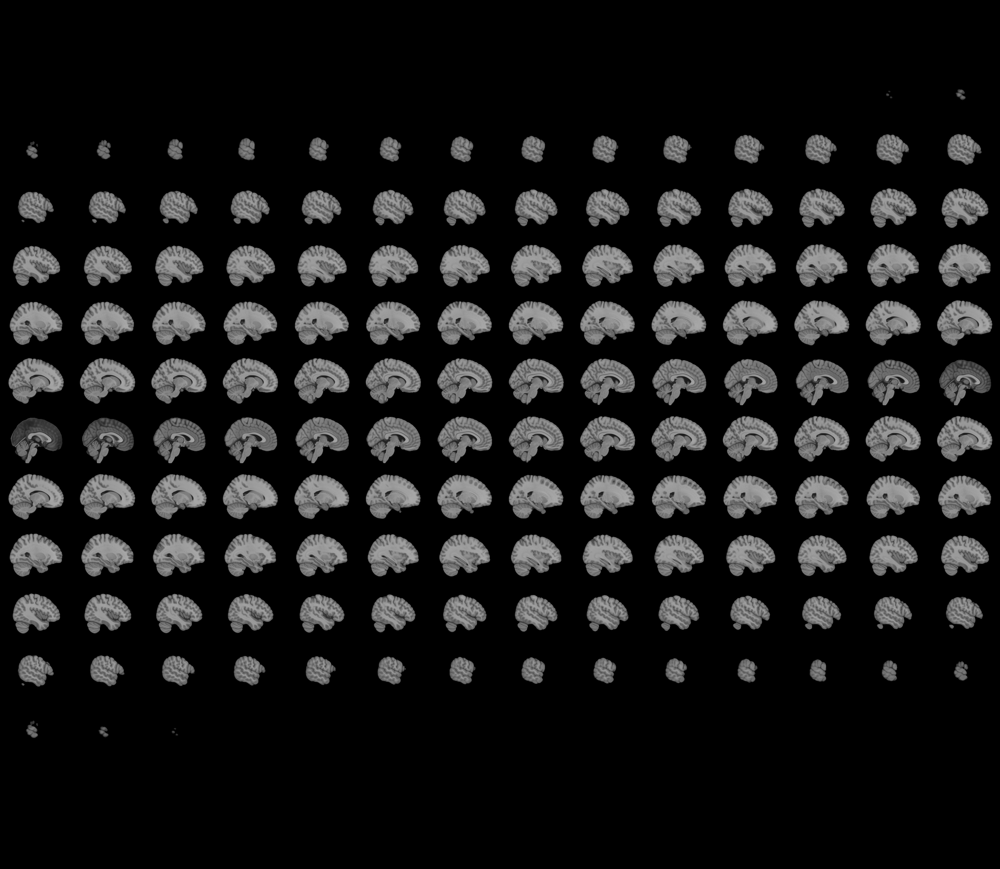
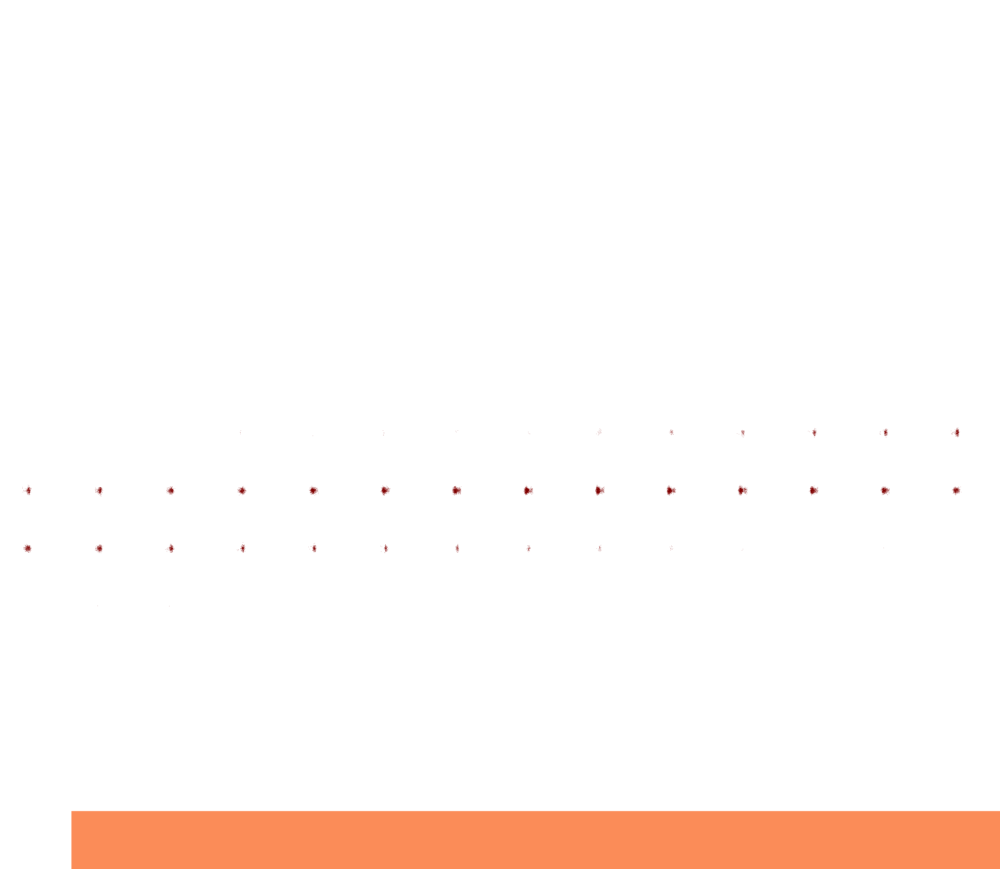

In [ ]:
# 6. Visualización interactiva
view = plotting.view_img(
    lesion_img_mal,
    bg_img=mni_img,
    cmap='OrRd',
    black_bg=True,
    threshold=0.1,
    title='Lesión cerebral espiculada simulando tumor maligno'
)
view

In [ ]:
# Extraer superficie 3D con marching cubes
verts, faces, _, _ = measure.marching_cubes(irregular_mask.astype(float), level=0.5)
xv, yv, zv = verts.T
i, j, k = faces.T

# Visualización Plotly
fig = go.Figure(data=[
    go.Mesh3d(
        x=xv, y=yv, z=zv,
        i=i, j=j, k=k,
        color='crimson',
        opacity=0.6,
        name='Lesión espiculada'
    )
])

fig.update_layout(
    title='Visualización 3D de lesión espiculada simulada',
    scene=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        aspectmode='data'
    ),
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()

# ¿ Y cuando no sabemos ?

In [ ]:
# Paso 1: Asegurar el shape del volumen cerebral
shape = mni_img.shape
x, y, z = np.indices(shape)
center1 = np.array([120, 90, 100])
radius1 = 10
dist1 = np.sqrt((x - center1[0])**2 + (y - center1[1])**2 + (z - center1[2])**2)

# Paso 2: Lesión esférica (benigna)
lesion_sphere = dist1 < radius1
lesion_sphere_img = new_img_like(mni_img, lesion_sphere.astype(np.uint8))

# Paso 3: Lesión espiculada (maligna) - CORREGIDA
np.random.seed(42)
deformation = 4 * np.sin(0.3 * x) * np.cos(0.3 * y) + 3 * np.random.randn(*shape)
lesion_spiculated = dist1 + deformation < radius1
lesion_spiculated_img = new_img_like(mni_img, lesion_spiculated.astype(np.uint8))

# Paso 4: Lesión intermedia (irregular pero menos agresiva)
deformation_intermediate = 1.5 * np.sin(0.2 * x) * np.cos(0.2 * y) + 1.0 * np.random.randn(*shape)
lesion_intermediate = dist1 + deformation_intermediate < radius1
smoothed_intermediate = gaussian_filter(lesion_intermediate.astype(float), sigma=1)
binary_intermediate = (smoothed_intermediate > 0.3).astype(np.uint8)
lesion_intermediate_img = new_img_like(mni_img, binary_intermediate)

In [ ]:
# Paso 4: Lesión intermedia (ahora más agresiva, similar a la maligna)

# Generar ruido con forma 3D
noise = 0.5 * np.random.randn(*shape)

# Aseguramos que todos los términos sean 3D
soft_pattern = 1.5 * np.sin(0.2 * x) * np.cos(0.2 * y) * np.sin(0.2 * z)  # ahora 3D

# Crear deformación compuesta
deformation_malignant_like = (
    0.7 * deformation +        # parte maligna
    0.3 * soft_pattern +       # patrón más suave, pero 3D
    noise                      # ruido moderado
)

# Generar la máscara
lesion_intermediate = dist1 + deformation_malignant_like < radius1

# Suavizado leve y binarización
smoothed_intermediate = gaussian_filter(lesion_intermediate.astype(float), sigma=0.7)
binary_intermediate = (smoothed_intermediate > 0.3).astype(np.uint8)

# Crear imagen NIfTI
lesion_intermediate_img = new_img_like(mni_img, binary_intermediate)


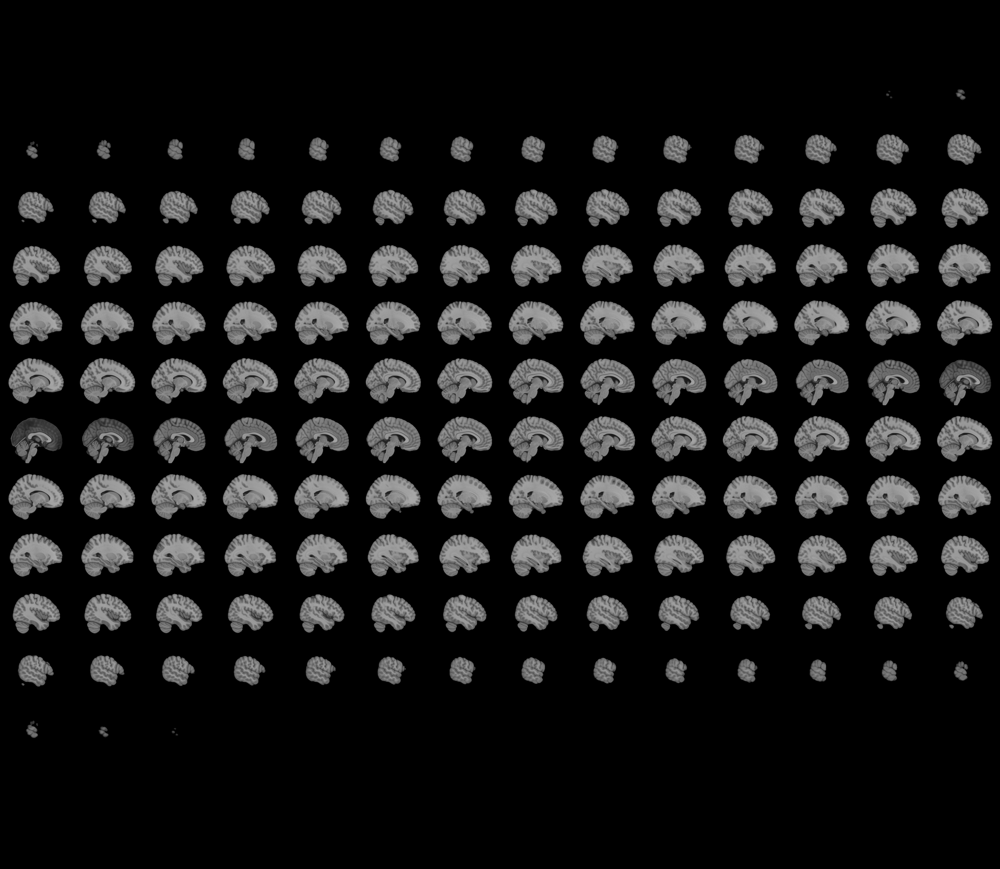
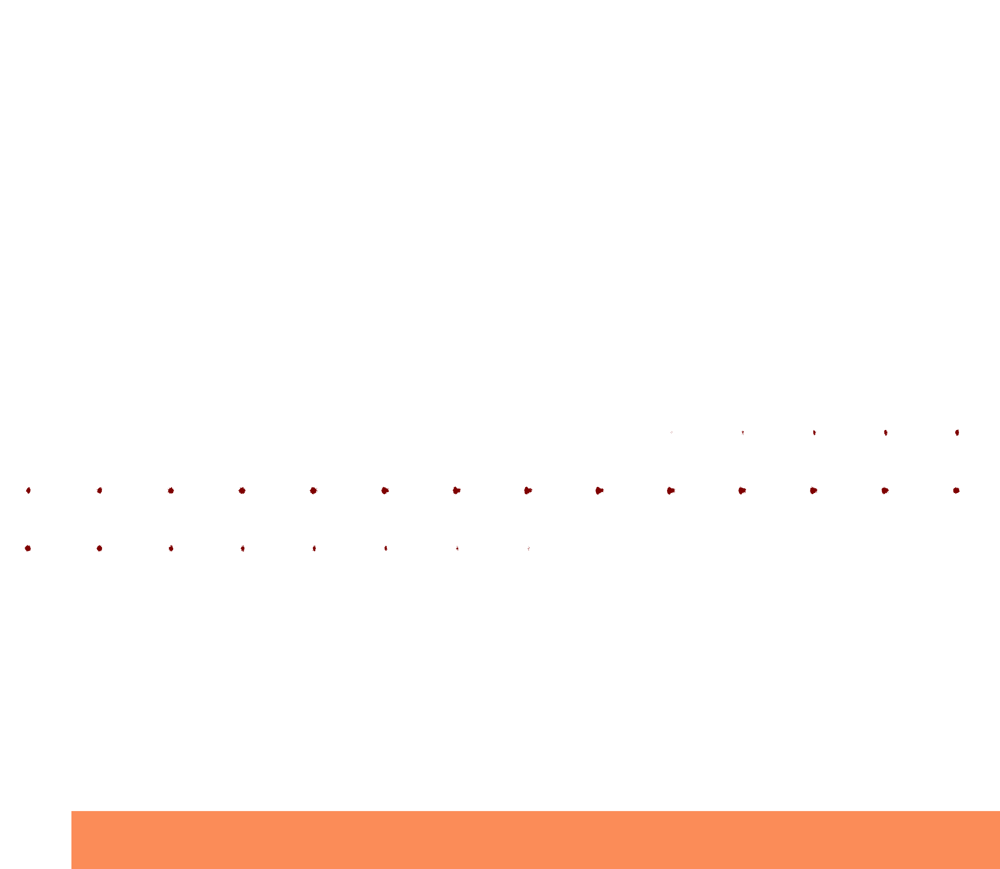

In [ ]:
# 6. Visualización interactiva
view = plotting.view_img(
    lesion_intermediate_img,
    bg_img=mni_img,
    cmap='OrRd',
    black_bg=True,
    threshold=0.1,
    title='Lesión cerebral espiculada simulando tumor maligno'
)
view

In [ ]:
# Extraer superficie con marching cubes
verts, faces, _, _ = measure.marching_cubes(smoothed_intermediate, level=0.5)
x, y, z = verts.T
i, j, k = faces.T

# Crear mesh en Plotly
fig = go.Figure(data=[
    go.Mesh3d(
        x=x, y=y, z=z,
        i=i, j=j, k=k,
        color='orange', opacity=0.5,
        name='Lesión intermedia'
    )
])

fig.update_layout(
    title="Lesión intermedia suavizada (superficie 3D)",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

In [ ]:
import plotly.graph_objects as go
from skimage import measure

# === Lesión intermedia ===
verts1, faces1, _, _ = measure.marching_cubes(smoothed_intermediate, level=0.5)
x1, y1, z1 = verts1.T
i1, j1, k1 = faces1.T

# === Lesión espiculada ===
verts2, faces2, _, _ = measure.marching_cubes(irregular_mask.astype(float), level=0.5)
x2, y2, z2 = verts2.T
i2, j2, k2 = faces2.T

# === Lesión esférica ===
verts3, faces3, _, _ = measure.marching_cubes(lesion_data.astype(float), level=0.5)
x3, y3, z3 = verts3.T
i3, j3, k3 = faces3.T

# ====



# === Unir todo en una sola figura ===
fig = go.Figure(data=[
    go.Mesh3d(
        x=x1, y=y1, z=z1,
        i=i1, j=j1, k=k1,
        color='orange', opacity=0.5,
        name='Lesión intermedia'
    ),
    go.Mesh3d(
        x=x2, y=y2, z=z2,
        i=i2, j=j2, k=k2,
        color='crimson', opacity=0.6,
        name='Lesión espiculada'
    ),
    go.Mesh3d(
        x=x3, y=y3, z=z3,
        i=i3, j=j3, k=k3,
        color='royalblue', opacity=0.6,
        name='Lesión esférica'
    )
])

fig.update_layout(
    title='Visualización 3D de lesiones: Intermedia, Espiculada y Esférica',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    legend=dict(x=0.02, y=0.98),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()

In [ ]:
import plotly.graph_objects as go
from skimage import measure

# === Lesión intermedia ===
verts1, faces1, _, _ = measure.marching_cubes(smoothed_intermediate, level=0.5)
x1, y1, z1 = verts1.T
i1, j1, k1 = faces1.T

# === Lesión espiculada ===
verts2, faces2, _, _ = measure.marching_cubes(irregular_mask.astype(float), level=0.5)
x2, y2, z2 = verts2.T
i2, j2, k2 = faces2.T

# === Lesión esférica ===
verts3, faces3, _, _ = measure.marching_cubes(lesion_data.astype(float), level=0.5)
x3, y3, z3 = verts3.T
i3, j3, k3 = faces3.T

# ====



# === Unir todo en una sola figura ===
fig = go.Figure(data=[
    go.Mesh3d(
        x=x3, y=y3, z=z3,
        i=i3, j=j3, k=k3,
        color='royalblue', opacity=0.6,
        name='Lesión esférica'
    ),
    go.Mesh3d(
        x=x2, y=y2, z=z2,
        i=i2, j=j2, k=k2,
        color='crimson', opacity=0.6,
        name='Lesión espiculada'
    ),
    go.Mesh3d(
        x=x1, y=y1, z=z1,
        i=i1, j=j1, k=k1,
        color='orange', opacity=0.9,  # aumentamos opacidad
        name='Lesión intermedia'
    )
])

fig.update_layout(
    title='Visualización 3D de lesiones: Intermedia, Espiculada y Esférica',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    legend=dict(x=0.02, y=0.98),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()

# Extracción de características

In [ ]:
# Paso 5: Función para extraer características radiómicas
def extract_features(img_nib, mask_nib):
    img_sitk = sitk.GetImageFromArray(np.transpose(img_nib.get_fdata(), (2, 1, 0)).astype(np.float32))
    mask_sitk = sitk.GetImageFromArray(np.transpose(mask_nib.get_fdata(), (2, 1, 0)).astype(np.uint8))
    mask_sitk.CopyInformation(img_sitk)
    extractor = featureextractor.RadiomicsFeatureExtractor()
    result = extractor.execute(img_sitk, mask_sitk)
    result = {k: v for k, v in result.items() if 'diagnostics' not in k}
    return pd.DataFrame.from_dict(result, orient='index', columns=['Valor'])

# Paso 6: Extraer características
features_sphere = extract_features(mni_img, lesion_sphere_img)
features_spiculated = extract_features(mni_img, lesion_spiculated_img)
features_intermediate = extract_features(mni_img, lesion_intermediate_img)

INFO:radiomics.featureextractor:No valid config parameter, using defaults: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 1, 'additionalInfo': True}
INFO:radiomics.featureextractor:Enabled image types: {'Original': {}}
INFO:radiomics.featureextractor:Enabled features: {'firstorder': [], 'glcm': [], 'gldm': [], 'glrlm': [], 'glszm': [], 'ngtdm': [], 'shape': []}
INFO:radiomics.featureextractor:Calculating features with label: 1
INFO:radiomics.featureextractor:Loading image and mask
INFO:radiomics.featureextractor:Computing shape
INFO:radiomics.featureextractor:Adding image type "Original" with custom settings: {}
INFO:radiomics.featureextractor:Calculating features for original image
INFO:radiomics.featureextractor:Computing firsto

# Visualización de las características extraidas

In [ ]:
# Convert the 'Valor' column to numeric, coercing errors to NaN
features_sphere['Valor'] = pd.to_numeric(features_sphere['Valor'], errors='coerce')

# Remove rows where 'Valor' is NaN (resulting from non-numeric values)
features_sphere = features_sphere.dropna(subset=['Valor'])

# Remove rows where 'Valor' is 0
features_sphere = features_sphere[features_sphere['Valor'] != 0]


In [ ]:
# Convert the 'Valor' column to numeric, coercing errors to NaN
features_spiculated['Valor'] = pd.to_numeric(features_spiculated['Valor'], errors='coerce')

# Remove rows where 'Valor' is NaN (resulting from non-numeric values)
features_spiculated = features_spiculated.dropna(subset=['Valor'])

# Remove rows where 'Valor' is 0
features_spiculated = features_spiculated[features_spiculated['Valor'] != 0]


In [ ]:
# Convert the 'Valor' column to numeric, coercing errors to NaN
features_intermediate['Valor'] = pd.to_numeric(features_intermediate['Valor'], errors='coerce')

# Remove rows where 'Valor' is NaN (resulting from non-numeric values)
features_intermediate = features_intermediate.dropna(subset=['Valor'])

# Remove rows where 'Valor' is 0
features_intermediate = features_intermediate[features_intermediate['Valor'] != 0]


In [ ]:
features_sphere

,Valor
original_shape_Elongation,1.0
original_shape_Flatness,1.0
original_shape_LeastAxisLength,17.819042
original_shape_MajorAxisLength,17.819042
original_shape_Maximum2DDiameterColumn,20.615528128088304
...,...
original_glszm_SmallAreaHighGrayLevelEmphasis,5.837261469795587e-08
original_glszm_SmallAreaLowGrayLevelEmphasis,5.837261469795587e-08
original_glszm_ZoneEntropy,-3.203426503814917e-16
original_glszm_ZonePercentage,0.00024160425223483932


In [ ]:
features_spiculated

,Valor
original_shape_Elongation,0.977552
original_shape_Flatness,0.963497
original_shape_LeastAxisLength,23.75588
original_shape_MajorAxisLength,24.655895
original_shape_Maximum2DDiameterColumn,42.42640687119285
...,...
original_glszm_SmallAreaLowGrayLevelEmphasis,0.8118512546739359
original_glszm_ZoneEntropy,1.0630061557039334
original_glszm_ZonePercentage,0.025945764981586877
original_glszm_ZoneVariance,213458.51920915706


In [ ]:
features_intermediate

,Valor
original_shape_Elongation,0.968567
original_shape_Flatness,0.920174
original_shape_LeastAxisLength,20.521985
original_shape_MajorAxisLength,22.302298
original_shape_Maximum2DDiameterColumn,29.154759474226502
...,...
original_glszm_SmallAreaLowGrayLevelEmphasis,0.6500000048358517
original_glszm_ZoneEntropy,1.3709505944546678
original_glszm_ZonePercentage,0.0007768800497203232
original_glszm_ZoneVariance,6614669.760000002


## Visualización de características benignas

In [ ]:
df_comparado = pd.merge(
    features_sphere.rename(columns={"Valor": "Esférica"}),
    features_spiculated.rename(columns={"Valor": "Espiculada"}),
    left_index=True, right_index=True
)

df_comparado_final = pd.merge(
    df_comparado,
    features_intermediate.rename(columns={"Valor": "Intermedia"}),
    left_index=True, right_index=True
)

# Forzar conversión a tipo float explícitamente
df_comparado_final["Esférica"] = pd.to_numeric(df_comparado_final["Esférica"], errors="coerce").astype(float)
df_comparado_final["Espiculada"] = pd.to_numeric(df_comparado_final["Espiculada"], errors="coerce").astype(float)
df_comparado_final["Intermedia"] = pd.to_numeric(df_comparado_final["Intermedia"], errors="coerce").astype(float)

df_log = np.log10(df_comparado_final.replace(0, np.nan))  # evitar log(0)

# Reemplazar ceros por NaN antes de aplicar log10
df_log = np.log10(df_comparado_final.replace(0, np.nan))



/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning:

invalid value encountered in log10



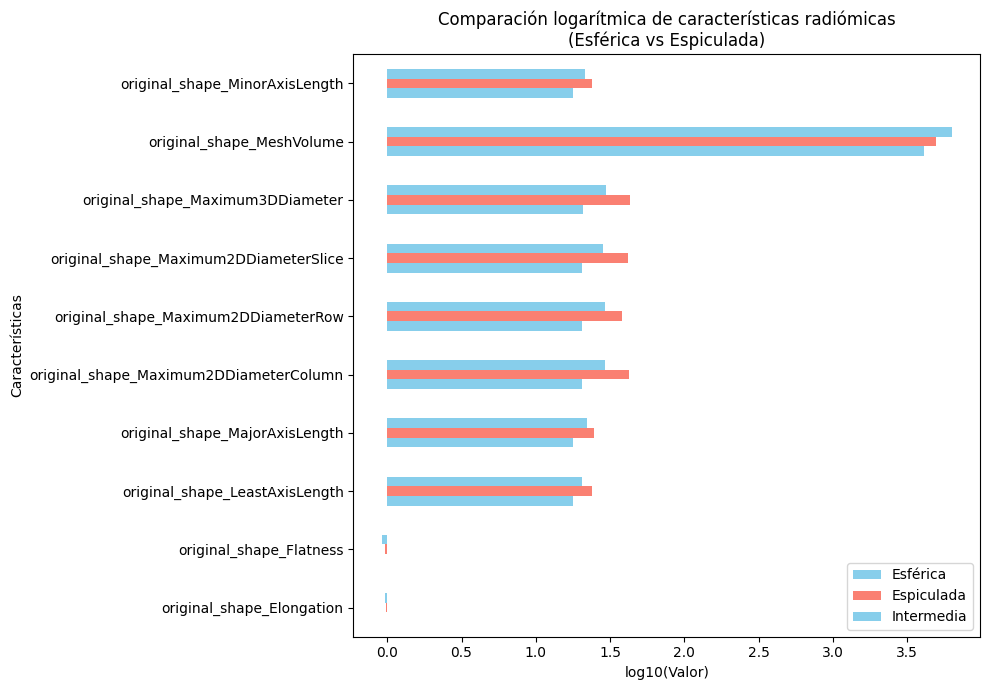

In [ ]:
# Gráfico en escala logarítmica
df_log[0:10].plot(kind="barh", figsize=(10, 7), color=["skyblue", "salmon"])
plt.title("Comparación logarítmica de características radiómicas\n(Esférica vs Espiculada)")
plt.xlabel("log10(Valor)")
plt.ylabel("Características")
plt.tight_layout()
plt.show()

# Comparación entre lesiones

In [ ]:
# Perform the first merge between features_sphere and features_spiculated
df_comparado_2 = pd.merge(
    features_sphere.rename(columns={"Valor": "Esférica"}),
    features_spiculated.rename(columns={"Valor": "Espiculada"}),
    left_index=True, right_index=True
)

# Then, merge the result with features_intermediate
df_comparado_3 = pd.merge(
    df_comparado_2,
    features_intermediate.rename(columns={"Valor": "Intermedia"}),
    left_index=True, right_index=True
)

# Forzar conversión a tipo float explícitamente
df_comparado_3["Esférica"] = pd.to_numeric(df_comparado_3["Esférica"], errors="coerce").astype(float)
df_comparado_3["Espiculada"] = pd.to_numeric(df_comparado_3["Espiculada"], errors="coerce").astype(float)
df_comparado_3["Intermedia"] = pd.to_numeric(df_comparado_3["Intermedia"], errors="coerce").astype(float)

# Paso 1: Calcular el promedio fila a fila (centroide de las tres condiciones)
df_comparado_3["media"] = df_comparado_3[["Esférica", "Espiculada", "Intermedia"]].mean(axis=1)

# Paso 2: Calcular la desviación absoluta respecto del promedio
df_comparado_3["abs_diff_esf"] = np.abs(df_comparado_3["Esférica"] - df_comparado_3["media"])
df_comparado_3["abs_diff_esp"] = np.abs(df_comparado_3["Espiculada"] - df_comparado_3["media"])
df_comparado_3["abs_diff_int"] = np.abs(df_comparado_3["Intermedia"] - df_comparado_3["media"])

# Paso 3: Aplicar logaritmo natural con constante pequeña para evitar log(0)
df_comparado_3["log_dev_esf"] = np.log(df_comparado_3["abs_diff_esf"] + 1e-6)
df_comparado_3["log_dev_esp"] = np.log(df_comparado_3["abs_diff_esp"] + 1e-6)
df_comparado_3["log_dev_int"] = np.log(df_comparado_3["abs_diff_int"] + 1e-6)


In [ ]:
df_comparado_3

,Esférica,Espiculada,Intermedia,media,abs_diff_esf,abs_diff_esp,abs_diff_int,log_dev_esf,log_dev_esp,log_dev_int
original_shape_Elongation,1.000000e+00,0.977552,0.968567,0.982040,0.017960,0.004487,0.013473,-4.019542,-5.406265,-4.307008
original_shape_Flatness,1.000000e+00,0.963497,0.920174,0.961224,0.038776,0.002273,0.041050,-3.249915,-6.086011,-3.192941
original_shape_LeastAxisLength,1.781904e+01,23.755880,20.521985,20.698969,2.879927,3.056911,0.176984,1.057765,1.117405,-1.731690
original_shape_MajorAxisLength,1.781904e+01,24.655895,22.302298,21.592412,3.773370,3.063483,0.709887,1.327969,1.119553,-0.342649
original_shape_Maximum2DDiameterColumn,2.061553e+01,42.426407,29.154759,30.732231,10.116703,11.694175,1.577472,2.314188,2.459091,0.455824
...,...,...,...,...,...,...,...,...,...,...
original_glszm_SmallAreaHighGrayLevelEmphasis,5.837261e-08,0.811851,0.650000,0.487284,0.487284,0.324567,0.162716,-0.718907,-1.125259,-1.815741
original_glszm_SmallAreaLowGrayLevelEmphasis,5.837261e-08,0.811851,0.650000,0.487284,0.487284,0.324567,0.162716,-0.718907,-1.125259,-1.815741
original_glszm_ZoneEntropy,-3.203427e-16,1.063006,1.370951,0.811319,0.811319,0.251687,0.559632,-0.209093,-1.379564,-0.580475
original_glszm_ZonePercentage,2.416043e-04,0.025946,0.000777,0.008988,0.008746,0.016958,0.008211,-4.738990,-4.076975,-4.802134


In [ ]:
df_comparado_3["forma_mas_distinta"] = df_comparado_3[["log_dev_esf", "log_dev_esp", "log_dev_int"]].idxmax(axis=1)

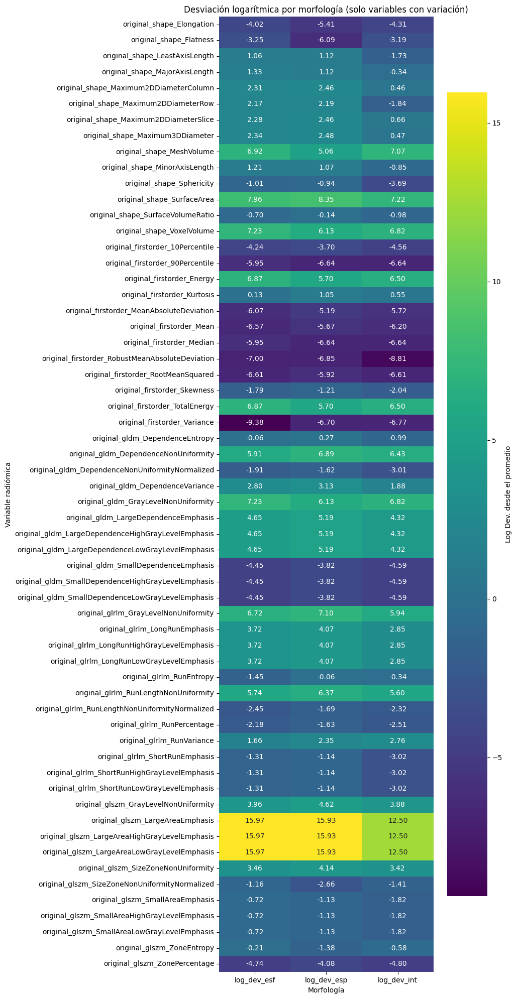

In [ ]:
# Paso 1: seleccionar las columnas de interés
heatmap_data = df_comparado_3[["log_dev_esf", "log_dev_esp", "log_dev_int"]]

# Paso 2: eliminar las filas donde los tres valores son exactamente iguales
heatmap_data = heatmap_data[~(heatmap_data.nunique(axis=1) == 1)]

# Paso 3: graficar el heatmap
plt.figure(figsize=(10, 20))  # Ajustar altura si hay muchas filas
sns.heatmap(heatmap_data, cmap="viridis", annot=True, fmt=".2f", cbar_kws={"label": "Log Dev. desde el promedio"})
plt.title("Desviación logarítmica por morfología (solo variables con variación)")
plt.xlabel("Morfología")
plt.ylabel("Variable radiómica")
plt.tight_layout()
plt.show()

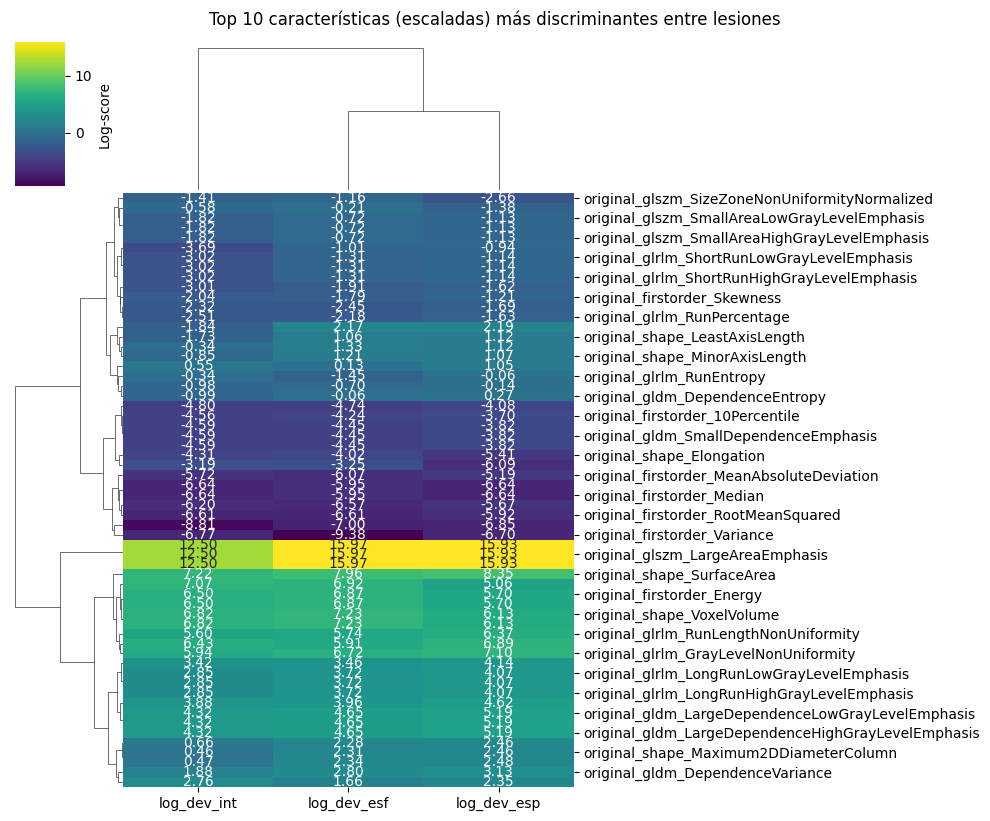

In [ ]:
heatmap_data_scaled = heatmap_data

# Clustermap con datos escalados
sns.clustermap(
    heatmap_data_scaled,
    method="complete",
    cmap="viridis",
    annot=True,
    fmt=".2f",
    figsize=(10, 8),
    col_cluster=True,
    row_cluster=True,
    cbar_kws={"label": "Log-score"}
)

plt.suptitle("Top 10 características (escaladas) más discriminantes entre lesiones", y=1.02)
plt.show()

# No supervisado - Dimensión de reduccionalidad


In [ ]:
# Transponer: cada morfología será una observación, cada variable radiómica una característica
df_pca = heatmap_data.T  # ahora filas = morfologías, columnas = variables radiómicas
df_pca.index.name = "Morfología"

# Escalamiento (muy importante para PCA)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_pca)

# PCA en 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Construir DataFrame para graficar
df_pca_result = pd.DataFrame(X_pca, columns=["PC1", "PC2"], index=df_pca.index)
df_pca_result["Morfología"] = df_pca_result.index

# Gráfico interactivo con Plotly
fig = px.scatter(df_pca_result,
                 x="PC1", y="PC2",
                 text="Morfología",
                 color="Morfología",
                 title="PCA interactivo de morfologías radiómicas (basado en log_dev)",
                 width=700, height=500)

# Estética del gráfico
fig.update_traces(marker=dict(size=14),
                  textposition="top center",
                  hovertemplate="<b>%{text}</b><br>PC1=%{x:.2f}<br>PC2=%{y:.2f}<extra></extra>")
fig.update_layout(showlegend=True,
                  xaxis_title=f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% varianza)",
                  yaxis_title=f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% varianza)",
                  template="plotly_white")

fig.show()

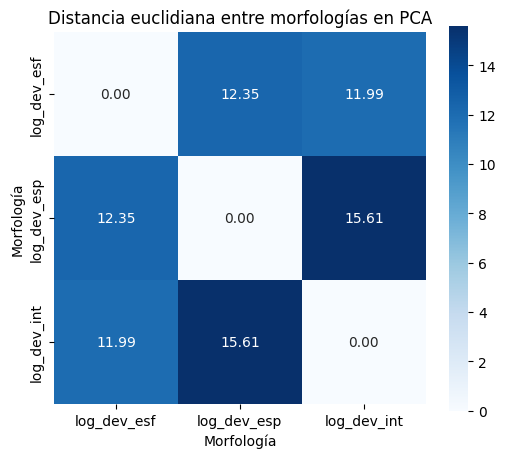

In [ ]:
from scipy.spatial.distance import pdist, squareform

# Calcular matriz de distancias euclidianas entre morfologías en el espacio PCA
distance_matrix = pd.DataFrame(
    squareform(pdist(df_pca_result[["PC1", "PC2"]], metric="euclidean")),
    index=df_pca_result.index,
    columns=df_pca_result.index
)

# Mostrar la tabla de distancias
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(distance_matrix, annot=True, fmt=".2f", cmap="Blues", square=True)
plt.title("Distancia euclidiana entre morfologías en PCA")
plt.show()

# Supervisado KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
import pandas as pd

# 1. Extraer los valores logarítmicos desde df_comparado_3
X_full = df_comparado_3[["log_dev_esf", "log_dev_esp", "log_dev_int"]].dropna().T

# 2. Etiquetas conocidas
X_train = X_full.iloc[:2]  # Esférica y Espiculada
y_train = ["Esférica (benigna)", "Espiculada (maligna)"]

# 3. Punto desconocido (Intermedia)
X_test = X_full.iloc[2].values.reshape(1, -1)

# 4. Estandarización
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 5. Aplicar KNN (k=1)
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

# 6. Predecir la clase de la lesión intermedia
pred_intermedia = knn.predict(X_test)

# 7. Resultado
print(f"La lesión intermedia fue clasificada como: {pred_intermedia[0]}")

La lesión intermedia fue clasificada como: Esférica (benigna)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names



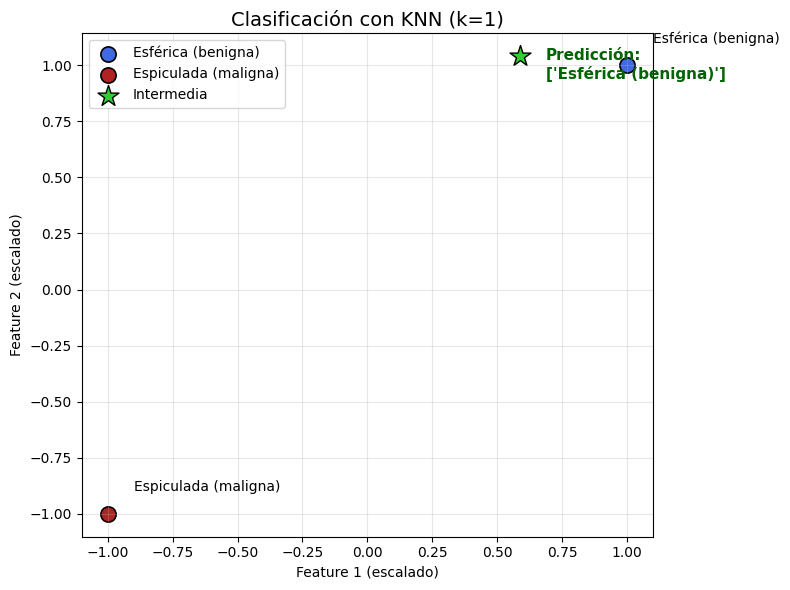

In [ ]:
# Gráfico 2D usando solo las dos primeras dimensiones
plt.figure(figsize=(8, 6))
colors = ['royalblue', 'firebrick']
labels = ['Esférica (benigna)', 'Espiculada (maligna)']

# Puntos de entrenamiento
for i in range(len(X_train_scaled)):
    x, y = X_train_scaled[i, 0], X_train_scaled[i, 1]
    plt.scatter(x, y, c=colors[i], s=120, label=labels[i], edgecolor='k', linewidth=1.2)
    plt.annotate(labels[i], (x + 0.1, y + 0.1), fontsize=10)

# Punto intermedio
x_test, y_test = X_test_scaled[0, 0], X_test_scaled[0, 1]
plt.scatter(x_test, y_test, c='limegreen', s=250, marker='*', edgecolors='k', label='Intermedia')
plt.annotate(f'Predicción:\n{pred_intermedia}',
             (x_test + 0.1, y_test - 0.1),
             fontsize=11, color='darkgreen', weight='bold')

# Estética
plt.title("Clasificación con KNN (k=1)", fontsize=14)
plt.xlabel("Feature 1 (escalado)")
plt.ylabel("Feature 2 (escalado)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()